# Project Objectives:
The primary goal of this project is to measure the quality of newly acquired customers (i.e who
have at least 1 successful order) for an e-commerce company using data analysis and machine
learning techniques. The key objectives to achieve this goal are as follows:
### 1- Define the target variable that will be used to measure customer quality.
### 2- Predict the quality of new customers.
### 3- Segment customers to identify distinct customer groups by using your output.
### 4- Recommend strategies to improve customer loyalty.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D
import plotly.graph_objects as go
from sklearn.model_selection import train_test_split, cross_val_score, ShuffleSplit
from sklearn.preprocessing import LabelEncoder, StandardScaler, MinMaxScaler
from sklearn.impute import KNNImputer
from sklearn.cluster import KMeans
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.linear_model import Ridge
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from xgboost import XGBRegressor
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset, Dataset
from sklearn.base import BaseEstimator, ClassifierMixin, RegressorMixin
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, classification_report, confusion_matrix
import math

# Mehmet ÜNLÜ - mehmet.k_unlu@hotmail.com

class files:
    app_open = 'app_open.csv'
    given_cilients = 'given_clients.csv'
    market_order = 'market_order.csv'
    product_detail = 'product_detail.csv'
    promo_detail = 'promo_detail.csv'

def print_info(df):
    print(f'head: {df.head()}')
    print(f'info: {df.info()}')
    print(f'describe: {df.describe()}')

def dynamic_scaling(df, column, apply_threshold, max_threshold):
    filtered_rows = df[df[column] > apply_threshold]
    max_value = filtered_rows[column].max()
    df.loc[filtered_rows.index, column] = apply_threshold + ((filtered_rows[column] - apply_threshold) / (max_value - apply_threshold)) * (max_threshold - apply_threshold)
    return df
    
def dynamic_scaling_negatif(df, column, apply_threshold, min_threshold):
    filtered_rows = df[df[column] < apply_threshold]
    min_value = filtered_rows[column].min()
    df.loc[filtered_rows.index, column] = apply_threshold - ((apply_threshold - filtered_rows[column]) / (apply_threshold - min_value)) * (apply_threshold - min_threshold)
    return df
    
given_clients = pd.read_csv(files.given_cilients)
print_info(given_clients)

head:                   client_id
0  6538ff945bbb65f457cc0150
1  6538ff945bbb65f457cc10e9
2  6538ff945bbb65f457cc162b
3  6538ff945bbb65f457cc17eb
4  6538ff945bbb65f457cc1b17
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27566 entries, 0 to 27565
Data columns (total 1 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   client_id  27566 non-null  object
dtypes: object(1)
memory usage: 215.5+ KB
info: None
describe:                        client_id
count                      27566
unique                     27566
top     6538ff945bbb65f457cc0150
freq                           1


## EDA and Feature Engineering

### app_open data set

In [2]:
app_open = pd.read_csv(files.app_open)
print(f'app_open client number: {app_open.client_id.nunique()} app_open shape: {app_open.shape}')
print(f'max date: {app_open.appopendate.max()} min date: {app_open.appopendate.min()}')

app_open.appopendate = pd.to_datetime(app_open.appopendate).dt.strftime("%Y-%m-%d-%H:%M")
app_open.appopendate = pd.to_datetime(app_open.appopendate)
app_open = app_open.drop_duplicates()
print_info(app_open)

app_open client number: 192822 app_open shape: (5671539, 2)
max date: 2021-01-27 23:59:58.518 min date: 2020-06-30 00:00:23.420
head:                   client_id         appopendate
0  6538ff945bbb65f457caae91 2020-06-30 04:53:00
1  6538ff945bbb65f457ca7ba0 2020-06-30 10:19:00
2  6538ff945bbb65f457cb17f1 2020-06-30 11:53:00
3  6538ff945bbb65f457ca6df8 2020-06-30 12:43:00
4  6538ff945bbb65f457ca9358 2020-06-30 12:33:00
<class 'pandas.core.frame.DataFrame'>
Index: 5075425 entries, 0 to 5671537
Data columns (total 2 columns):
 #   Column       Dtype         
---  ------       -----         
 0   client_id    object        
 1   appopendate  datetime64[ns]
dtypes: datetime64[ns](1), object(1)
memory usage: 116.2+ MB
info: None
describe:                          appopendate
count                        5075425
mean   2020-10-16 13:52:21.101042944
min              2020-06-30 00:00:00
25%              2020-08-31 19:49:00
50%              2020-10-16 17:37:00
75%              2020-11-30 09:39:0

In [3]:
def count_valid_opens(dates):
    # first open
    if len(dates) == 1:
        return 1
    
    sorted_dates = np.sort(dates)
    time_diffs = np.diff(sorted_dates) / np.timedelta64(1, 'h')

    # app oppening diffs are less than 4 hours. 
    # After 4 hours it was assumed to open the app for a new meal.
    return 1 + np.sum(time_diffs >= 4)

dummy_appopen = app_open.groupby('client_id').agg(app_open_count=('appopendate', lambda x: count_valid_opens(x.values)),
                                                  app_date_range=('appopendate',  lambda x: (x.max() - x.min()).days + 1)).reset_index()
# more date_range means more usage frequency
dummy_appopen['using_frequency'] = (dummy_appopen.app_open_count / dummy_appopen.app_date_range) * np.log10(dummy_appopen.app_date_range/2 + 1)
dummy_appopen['using_frequency'] = np.sqrt(dummy_appopen['using_frequency'])
# use dynamic scaling for using_frequency
dummy_appopen = dynamic_scaling(dummy_appopen, 'using_frequency', 0.7, 1)

app_open = app_open.merge(dummy_appopen, on='client_id', how='left')
app_open = app_open[['client_id','app_open_count','app_date_range','using_frequency']].drop_duplicates()

print_info(app_open)

head:                   client_id  app_open_count  app_date_range  using_frequency
0  6538ff945bbb65f457caae91              26             175         0.537829
1  6538ff945bbb65f457ca7ba0              10             208         0.311725
2  6538ff945bbb65f457cb17f1              11             192         0.337380
3  6538ff945bbb65f457ca6df8              20             207         0.441683
4  6538ff945bbb65f457ca9358              48             204         0.688192
<class 'pandas.core.frame.DataFrame'>
Index: 192822 entries, 0 to 5075090
Data columns (total 4 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   client_id        192822 non-null  object 
 1   app_open_count   192822 non-null  int64  
 2   app_date_range   192822 non-null  int64  
 3   using_frequency  192822 non-null  float64
dtypes: float64(1), int64(2), object(1)
memory usage: 7.4+ MB
info: None
describe:        app_open_count  app_date_range  using_frequency
count 

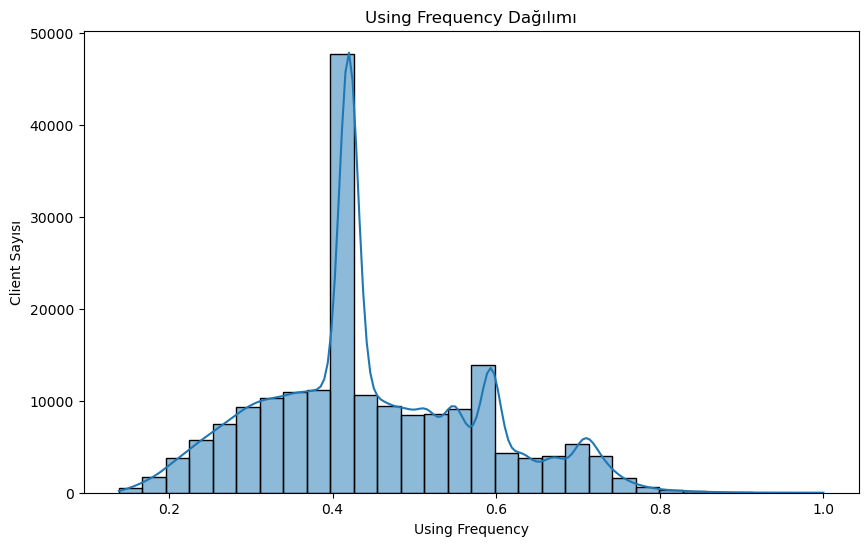

In [4]:
# Histogram
plt.figure(figsize=(10, 6))
sns.histplot(app_open['using_frequency'], bins=30, kde=True)
plt.title('Using Frequency Dağılımı')
plt.xlabel('Using Frequency')
plt.ylabel('Client Sayısı')
plt.show()


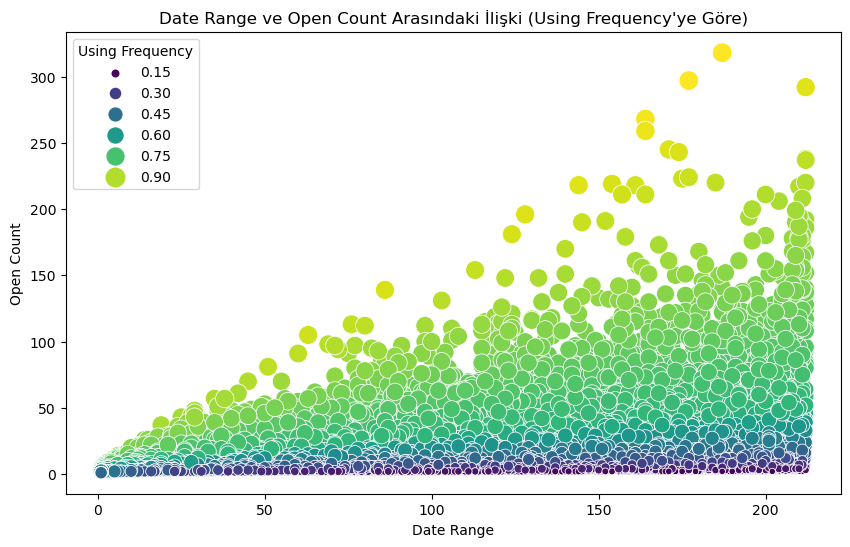

In [5]:
# 1. Date Range ve Open Count Arasındaki İlişki
plt.figure(figsize=(10, 6))
sns.scatterplot(data=app_open, x='app_date_range', y='app_open_count', hue='using_frequency', palette='viridis', size='using_frequency', sizes=(20, 200))
plt.title('Date Range ve Open Count Arasındaki İlişki (Using Frequency\'ye Göre)')
plt.xlabel('Date Range')
plt.ylabel('Open Count')
plt.legend(title='Using Frequency')
plt.show()

### product_detail data set

In [6]:
product_detail = pd.read_csv(files.product_detail)
print(f'product_detail unique order_id sayisi :{product_detail.order_id.nunique()}')
product_detail.drop('_pos',axis=1,inplace=True)
print_info(product_detail)

product_detail unique order_id sayisi :444825
head:                    order_id  count                product_id  price  \
0  6539005e5bbb65f457d50370      1  653901c45bbb65f457de3341  14.69   
1  6539005f5bbb65f457d6882e      1  653901c45bbb65f457de3341  14.69   
2  6539005f5bbb65f457d68829      1  653901c45bbb65f457de3341  14.69   
3  6539005f5bbb65f457d63a77      1  653901c45bbb65f457de3341  14.69   
4  6539005e5bbb65f457d4e4d4      1  653901c45bbb65f457de3341  13.95   

             subcategory_id                  brand_id  \
0  653902045bbb65f457de36a5  653902215bbb65f457de3ad9   
1  653902045bbb65f457de36a5  653902215bbb65f457de3ad9   
2  653902045bbb65f457de377a  653902215bbb65f457de3ad9   
3  653902045bbb65f457de36a5  653902215bbb65f457de3ad9   
4  653902045bbb65f457de36a5  653902215bbb65f457de3ad9   

          mastercategory_id  
0  653902515bbb65f457de3b9d  
1  653902515bbb65f457de3b9d  
2  653902515bbb65f457de3b9d  
3  653902515bbb65f457de3b9d  
4  653902515bbb65f457de3b9d 

In [7]:
product_detail['product_total_price'] = product_detail['count'] * product_detail['price']
dummy_productdetail = product_detail.groupby('order_id')['product_total_price'].agg(total_price= 'sum', mean_price='mean')

total_piece = product_detail.groupby('order_id')['count'].agg(total_piece='sum')
product_detail = product_detail.merge(total_piece, on='order_id', how='left')
product_detail = product_detail.merge(dummy_productdetail, on='order_id', how='left')
product_detail.drop('product_total_price', axis=1, inplace=True)

product_detail_exp = product_detail.copy()
product_detail_exp['count'] = product_detail_exp['count'].apply(lambda x: [x] * x)
product_detail_exp = product_detail_exp.explode('count')
mode_mastercategory=product_detail_exp.groupby('order_id').agg({'mastercategory_id': lambda x: x.mode()[0]}).rename(columns={'mastercategory_id':'mastercategory_mode'})
mode_brand=product_detail_exp.groupby('order_id').agg({'brand_id': lambda x: x.mode()[0]}).rename(columns={'brand_id':'brand_mode'})
mode_subcategory=product_detail_exp.groupby('order_id').agg({'subcategory_id': lambda x: x.mode()[0]}).rename(columns={'subcategory_id':'subcategory_mode'})
mode_product=product_detail_exp.groupby('order_id').agg({'product_id': lambda x: x.mode()[0]}).rename(columns={'product_id':'product_mode'})

product_detail = product_detail.merge(pd.concat([mode_mastercategory, mode_brand, mode_subcategory, mode_product], axis=1), on='order_id', how='left')
product_detail.drop(['mastercategory_id', 'brand_id', 'subcategory_id', 'product_id', 'count', 'price'], axis=1, inplace=True)
product_detail = product_detail.drop_duplicates()
print_info(product_detail)

head:                    order_id  total_piece  total_price  mean_price  \
0  6539005e5bbb65f457d50370           19      51.7604    10.35208   
1  6539005f5bbb65f457d6882e            2      23.5900    11.79500   
2  6539005f5bbb65f457d68829            2      23.5900    11.79500   
3  6539005f5bbb65f457d63a77            4      24.8600    12.43000   
4  6539005e5bbb65f457d4e4d4            4      20.7400     5.18500   

        mastercategory_mode                brand_mode  \
0  653902515bbb65f457de3ba2  653902215bbb65f457de397f   
1  653902515bbb65f457de3b9d  653902215bbb65f457de3ad9   
2  653902515bbb65f457de3b9d  653902215bbb65f457de3ad9   
3  653902515bbb65f457de3b9d  653902215bbb65f457de3923   
4  653902515bbb65f457de3b9d  653902215bbb65f457de3908   

           subcategory_mode              product_mode  
0  653902045bbb65f457de3677  653901c45bbb65f457de33b6  
1  653902045bbb65f457de36a5  653901c45bbb65f457de3287  
2  653902045bbb65f457de377a  653901c45bbb65f457de3287  
3  653902045

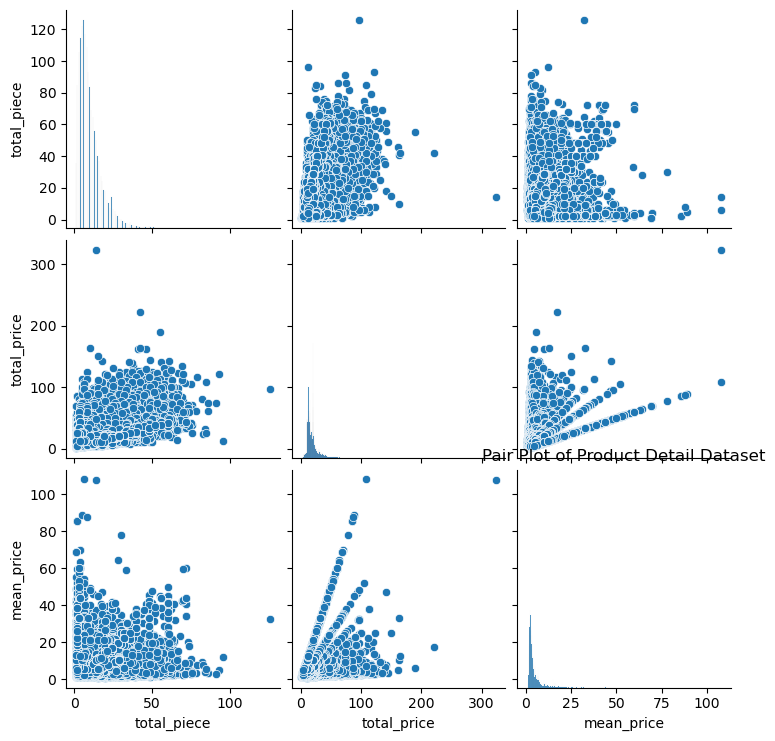

In [8]:
sns.pairplot(product_detail)
plt.title("Pair Plot of Product Detail Dataset")
plt.show()

### promo_detail data set

In [9]:
promo_detail = pd.read_csv(files.promo_detail)
promo_detail.promoobjective = promo_detail.promoobjective.astype(int)
promo_product_detail = product_detail.merge(promo_detail, on='order_id', how='left')
promo_product_detail.fillna('NOT', inplace=True)
promo_product_detail.promoobjective.replace('NOT', 0, inplace=True)
print_info(promo_product_detail)

head:                    order_id  total_piece  total_price  mean_price  \
0  6539005e5bbb65f457d50370           19      51.7604    10.35208   
1  6539005f5bbb65f457d6882e            2      23.5900    11.79500   
2  6539005f5bbb65f457d68829            2      23.5900    11.79500   
3  6539005f5bbb65f457d63a77            4      24.8600    12.43000   
4  6539005e5bbb65f457d4e4d4            4      20.7400     5.18500   

        mastercategory_mode                brand_mode  \
0  653902515bbb65f457de3ba2  653902215bbb65f457de397f   
1  653902515bbb65f457de3b9d  653902215bbb65f457de3ad9   
2  653902515bbb65f457de3b9d  653902215bbb65f457de3ad9   
3  653902515bbb65f457de3b9d  653902215bbb65f457de3923   
4  653902515bbb65f457de3b9d  653902215bbb65f457de3908   

           subcategory_mode              product_mode  \
0  653902045bbb65f457de3677  653901c45bbb65f457de33b6   
1  653902045bbb65f457de36a5  653901c45bbb65f457de3287   
2  653902045bbb65f457de377a  653901c45bbb65f457de3287   
3  65390

### market_order data set

In [10]:
market_order = pd.read_csv(files.market_order, low_memory=False)
market_order.rename(columns={'createdat':'createdate'}, inplace=True)
market_order.orderdate = pd.to_datetime(market_order.orderdate).dt.strftime("%Y-%m-%d-%H:%M")
market_order.createdate = pd.to_datetime(market_order.createdate).dt.strftime("%Y-%m-%d-%H:%M")
market_order.ratedate = pd.to_datetime(market_order.ratedate).dt.strftime("%Y-%m-%d-%H:%M")
market_order.deliverdate = pd.to_datetime(market_order.deliverdate).dt.strftime("%Y-%m-%d-%H:%M")
market_order.orderdate = pd.to_datetime(market_order.orderdate)
market_order.createdate = pd.to_datetime(market_order.createdate)
market_order.ratedate = pd.to_datetime(market_order.ratedate)
market_order.deliverdate = pd.to_datetime(market_order.deliverdate)

market_order.devicename = list(map(lambda x: x[1] if len(x)> 1 else x, market_order.devicename.str.lower().str.split(';')))
market_order.loc[~market_order.devicename.isin(market_order.devicename.value_counts()[:13].index), 'devicename'] = 'Other'

market_order.dropna(subset=['chargedamount'], inplace=True)

market_order = market_order.sort_values(['client_id', 'orderdate'], ascending=[True, True])
market_order['prev_order_count'] = market_order.groupby('client_id').cumcount()
market_order['next_order_price'] = market_order.groupby('client_id')['chargedamount'].shift(-1)
market_order['next_order_date'] = market_order.groupby('client_id')['orderdate'].shift(-1)
market_order['days_to_next_order'] = (market_order['next_order_date'] - market_order['orderdate']).dt.days + 1
market_order.drop('next_order_date', axis=1, inplace=True)
print_info(market_order)

head:                       client_id                  order_id           orderdate  \
0      6538ff945bbb65f457ca697d  6539005d5bbb65f457d060ff 2020-06-30 09:46:00   
48342  6538ff945bbb65f457ca697d  6539005d5bbb65f457d11dd5 2020-07-14 17:48:00   
48868  6538ff945bbb65f457ca697d  6539005d5bbb65f457d11fe3 2020-08-16 07:40:00   
1      6538ff945bbb65f457ca697e  6539005d5bbb65f457d06100 2020-06-30 10:11:00   
62174  6538ff945bbb65f457ca697e  6539005d5bbb65f457d153dd 2020-07-23 15:21:00   

               createdate                   city_id devicename addressname  \
0     2020-06-30 09:38:00  653900075bbb65f457d060f9      apple        Home   
48342 2020-07-14 14:31:00  653900075bbb65f457d060f9      apple        Home   
48868 2020-08-16 07:34:00  653900075bbb65f457d060f9      apple        Home   
1     2020-06-29 21:31:00  653900075bbb65f457d060f9     xiaomi        Casa   
62174 2020-07-23 15:15:00  653900075bbb65f457d060f9     xiaomi        Casa   

       distance   aandm  basketvalue  

In [11]:
# delivery time and decision time
market_order['delivery_time'] = (market_order.deliverdate - market_order.orderdate).dt.total_seconds() / 60
market_order['decision_time'] = (market_order.orderdate - market_order.createdate).dt.total_seconds() / 60
#scaling
market_order = dynamic_scaling(market_order, 'delivery_time', 80, 100)
market_order = dynamic_scaling(market_order, 'decision_time', 1000, 1500)

# discount rate and discount rate mean by client
market_order['discount_rate'] = market_order.discountamount / market_order.basketvalue

# Regain Rate is a measure of how much of the lost revenue is recovered by the company.
market_order['regain_amount'] = market_order.chargedamount - market_order.aandm
market_order['regain_potential'] = np.where(market_order['regain_amount'] < 0, 
                                       (market_order['regain_amount']) /  (np.log2(3*market_order.prev_order_count/(market_order.aandm + 1) + 2)),
                                       (market_order['regain_amount']) * (np.log2(3*market_order.prev_order_count/(market_order.aandm + 1) + 2)))
market_order = dynamic_scaling(market_order, 'regain_potential', 100, 200)
market_order = dynamic_scaling(market_order, 'regain_potential', 118, 120)
market_order = dynamic_scaling_negatif(market_order, 'regain_potential', -10, -14)
# regain amount cumsum 
market_order['regain_amount_cumsum'] = market_order.groupby('client_id')['regain_amount'].cumsum()

dummy = market_order.groupby('client_id').agg(order_count=('orderdate', 'size'),
                                            order_date_range=('orderdate', lambda x: (x.max() - x.min()).days + 1),
                                            total_regain_amount=('regain_amount', 'sum'),
                                            total_fin_cost=('aandm', 'sum'),
                                            regain_pot_avg=('regain_potential', 'mean'),
                                            delivery_time_avg=('delivery_time', 'mean'),
                                            decision_time_avg=('decision_time', 'mean'),
                                            discount_rate_avg=('discount_rate', 'mean'),
                                            charged_amount_avg=('chargedamount', 'mean'),
                                            mean_days_to_next_order=('days_to_next_order', 'mean')).reset_index()
dummy['order_frequency'] = (dummy.order_count / dummy.order_date_range) * np.log2(dummy.order_date_range/(dummy.mean_days_to_next_order) + 1)
dummy['order_frequency'] = np.sqrt(dummy['order_frequency'])
market_order = market_order.merge(dummy, on='client_id', how='left')
# 10 kok 25 nasil yapilir 10 ** (1/25)
# hex features
dummy3 = market_order.groupby('hex_id').agg(hex_delivery_time=('delivery_time', 'mean'),
                                            hex_regain_pot=('regain_potential', 'mean'),
                                            hex_charged_amount_avg=('chargedamount', 'mean')).reset_index()
market_order = market_order.merge(dummy3, on='hex_id', how='left')
# scaling

market_order = dynamic_scaling(market_order, 'order_frequency', 1.8, 2)


market_order.drop(['hex_id','addressname'], axis=1, inplace=True)

df_train=market_order.merge(app_open,on='client_id',how='left').merge(promo_product_detail,on='order_id',how='left')
df_train.head()

,client_id,order_id,orderdate,createdate,city_id,devicename,distance,aandm,basketvalue,chargedamount,...,total_piece,total_price,mean_price,mastercategory_mode,brand_mode,subcategory_mode,product_mode,promo_id,responsibledepartment_id,promoobjective
0,6538ff945bbb65f457ca697d,6539005d5bbb65f457d060ff,2020-06-30 09:46:00,2020-06-30 09:38:00,653900075bbb65f457d060f9,apple,1373.0,6.4050,26.4400,16.4394,...,8,26.440,3.305000,653902515bbb65f457de3bba,653902215bbb65f457de38e2,653902045bbb65f457de36c1,653901c45bbb65f457de2d9e,653903915bbb65f457de3e3f,653903b15bbb65f457de3fe3,1.0
1,6538ff945bbb65f457ca697d,6539005d5bbb65f457d11dd5,2020-07-14 17:48:00,2020-07-14 14:31:00,653900075bbb65f457d060f9,apple,1373.0,5.4699,11.0600,4.8500,...,4,11.060,2.765000,653902515bbb65f457de3b98,653902215bbb65f457de3903,653902045bbb65f457de36dd,653901c45bbb65f457de2d0e,653903915bbb65f457de3cf4,653903b15bbb65f457de3fe3,2.0
2,6538ff945bbb65f457ca697d,6539005d5bbb65f457d11fe3,2020-08-16 07:40:00,2020-08-16 07:34:00,653900075bbb65f457d060f9,apple,1373.0,6.3715,22.8601,16.1710,...,12,22.381,2.486778,653902515bbb65f457de3bc7,653902215bbb65f457de39e3,653902045bbb65f457de367b,653901c45bbb65f457de34aa,653903915bbb65f457de3cf5,653903b15bbb65f457de3fe3,2.0
3,6538ff945bbb65f457ca697e,6539005d5bbb65f457d06100,2020-06-30 10:11:00,2020-06-29 21:31:00,653900075bbb65f457d060f9,xiaomi,820.0,9.9455,20.7300,5.2100,...,9,20.210,2.887143,653902515bbb65f457de3b9b,653902215bbb65f457de38e0,653902045bbb65f457de367d,653901c45bbb65f457de3033,653903915bbb65f457de3f1c,653903b15bbb65f457de3fe3,1.0
4,6538ff945bbb65f457ca697e,6539005d5bbb65f457d153dd,2020-07-23 15:21:00,2020-07-23 15:15:00,653900075bbb65f457d060f9,xiaomi,820.0,5.0219,11.9801,5.5105,...,7,11.720,1.674286,653902515bbb65f457de3b97,653902215bbb65f457de39bc,653902045bbb65f457de367d,653901c45bbb65f457de2d29,653903915bbb65f457de3cf4,653903b15bbb65f457de3fe3,2.0


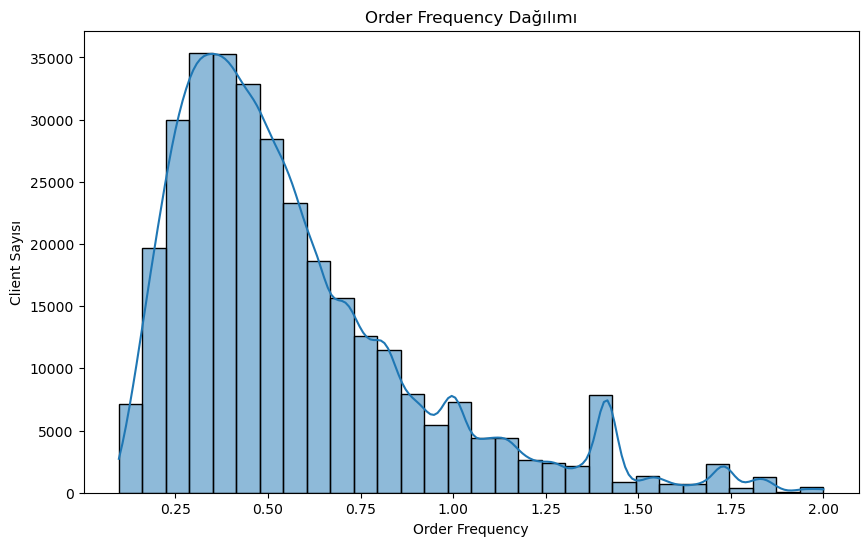

In [12]:
# order_frequency dagılımı
plt.figure(figsize=(10, 6))
sns.histplot(df_train['order_frequency'], bins=30, kde=True)
plt.title('Order Frequency Dağılımı')
plt.xlabel('Order Frequency')
plt.ylabel('Client Sayısı')
plt.show()

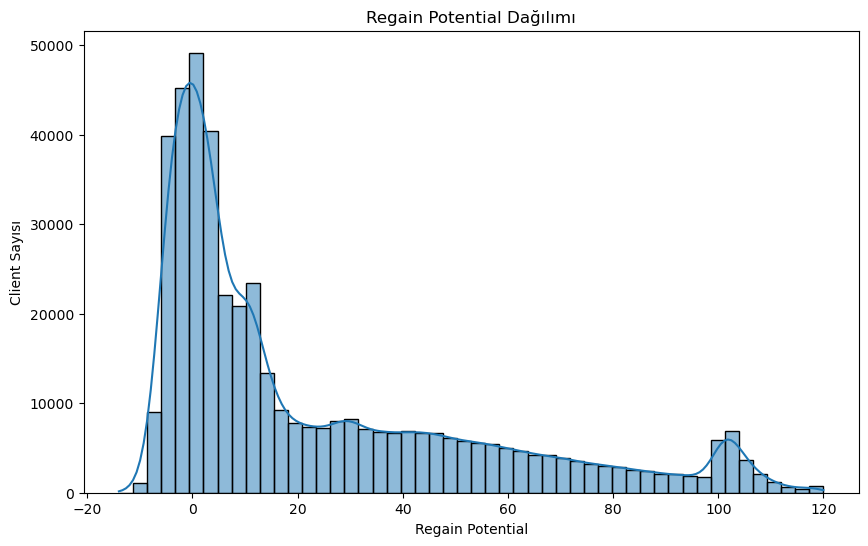

In [13]:
#regain_potential plot
plt.figure(figsize=(10, 6))
sns.histplot(df_train['regain_potential'], bins=50, kde=True)
plt.title('Regain Potential Dağılımı')
plt.xlabel('Regain Potential')
plt.ylabel('Client Sayısı')
plt.show()


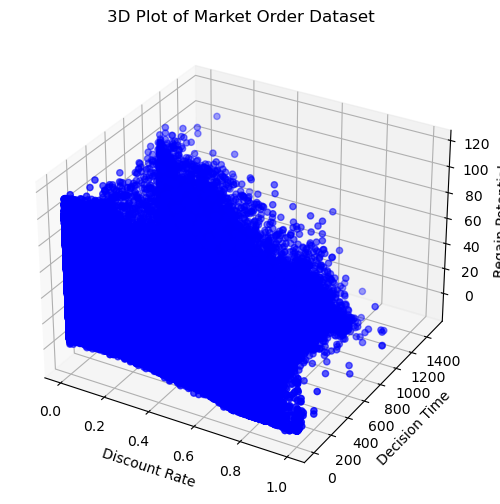

In [14]:
# 3D plot
fig = plt.figure(figsize=(10, 6))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(df_train['discount_rate'], df_train['decision_time'], df_train['regain_pot_avg'], c='b', marker='o')
ax.set_xlabel('Discount Rate')
ax.set_ylabel('Decision Time')
ax.set_zlabel('Regain Potential')
plt.title('3D Plot of Market Order Dataset')
plt.show()

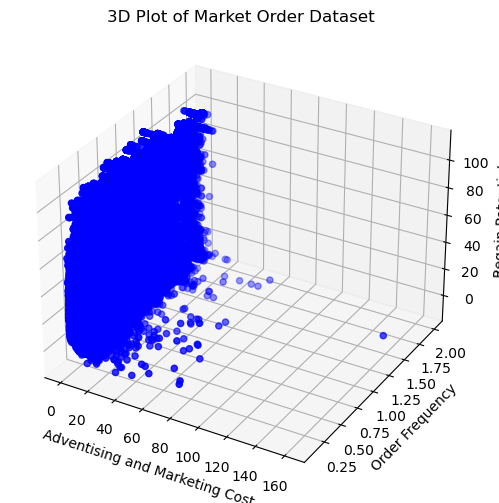

In [15]:
# 3D plot
fig = plt.figure(figsize=(10, 6))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(df_train['aandm'], df_train['order_frequency'], df_train['regain_pot_avg'], c='b', marker='o')
ax.set_xlabel('Adventising and Marketing Cost')
ax.set_ylabel('Order Frequency')
ax.set_zlabel('Regain Potential')
plt.title('3D Plot of Market Order Dataset')
plt.show()

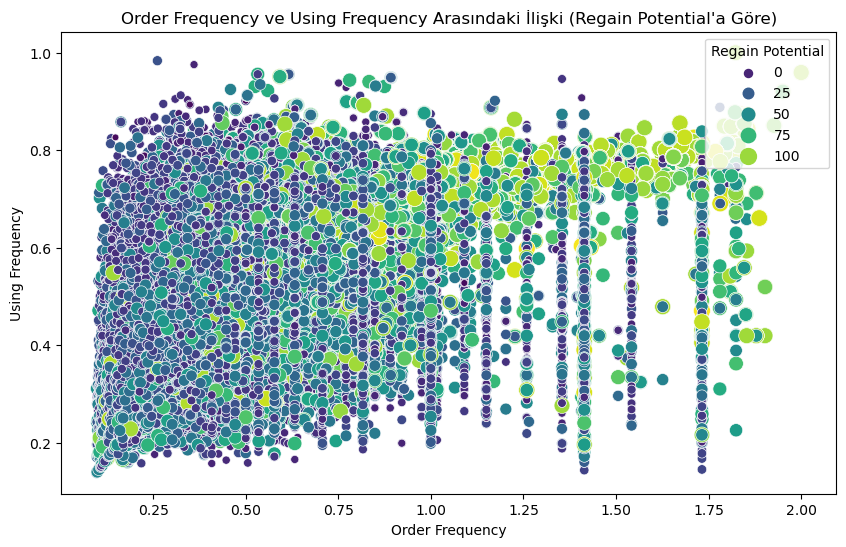

In [16]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_train, x='order_frequency', y='using_frequency', hue='regain_potential', palette='viridis', size='regain_potential', sizes=(20, 150))
plt.title('Order Frequency ve Using Frequency Arasındaki İlişki (Regain Potential\'a Göre)')
plt.xlabel('Order Frequency')
plt.ylabel('Using Frequency')
plt.legend(title='Regain Potential', loc='upper right')
plt.show()

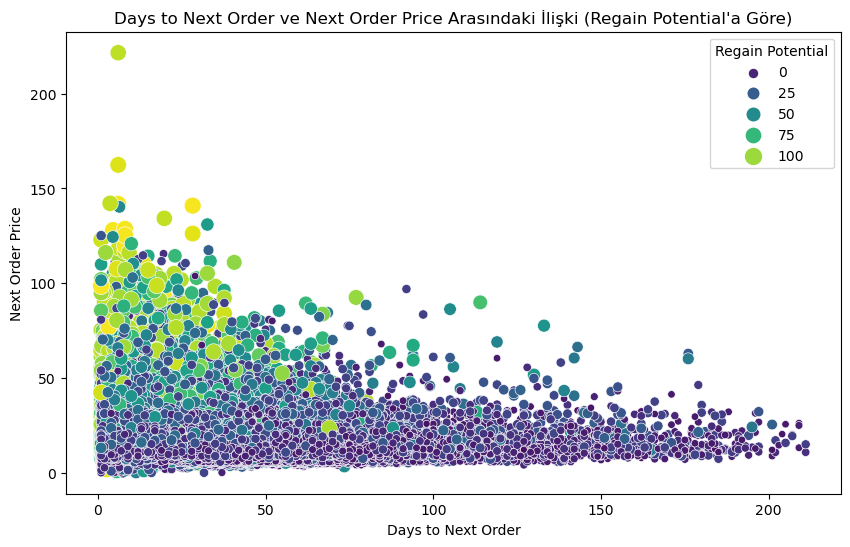

In [17]:
#days to next order and next order price with regain potential plot
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_train, x='mean_days_to_next_order', y='next_order_price', hue='regain_potential', palette='viridis', size='regain_potential', sizes=(20, 150))
plt.title('Days to Next Order ve Next Order Price Arasındaki İlişki (Regain Potential\'a Göre)')
plt.xlabel('Days to Next Order')
plt.ylabel('Next Order Price')
plt.legend(title='Regain Potential', loc='upper right')
plt.show()

In [22]:
print(df_train.isnull().sum())

client_id                        0
order_id                         0
orderdate                        0
createdate                       0
city_id                          0
devicename                       0
distance                         0
aandm                            0
basketvalue                      0
chargedamount                    0
deliveryfee                      0
discountamount                   0
supliersupport                   0
thirdpartysupport                0
ratedate                    263934
rateisskipped                    0
rating                      350010
ratereason                  444815
deliverdate                      0
warehouse_id                     0
prev_order_count                 0
next_order_price                 0
days_to_next_order               0
delivery_time                    0
decision_time                    0
discount_rate                    0
regain_amount                    0
regain_potential                 0
regain_amount_cumsum

In [19]:
# mean days to next order kolonunda null olanlari -1 ile doldur
last_orders = df_train[df_train.days_to_next_order.isnull()]
df_train.loc[last_orders.index, 'mean_days_to_next_order'] = -1
df_train.loc[last_orders.index, 'days_to_next_order'] = -1
df_train.loc[df_train.next_order_price.isnull(), 'next_order_price'] = -1
df_train.loc[df_train.order_frequency.isnull(), 'order_frequency'] = 0.0

### Data Splitting and Clustering

In [24]:
dummy = df_train.groupby('client_id').agg(distance_mean=('distance', 'mean'),
                                            deliveryfee_mean=('deliveryfee', 'mean'),
                                            supliersupport_mean=('supliersupport', 'mean'),
                                            total_piece_mean=('total_piece', 'mean'),
                                            mean_price_avg=('mean_price', 'mean'),
                                            mode_warehouse_id=('warehouse_id', lambda x: x.mode()[0]),
                                            mode_mastercategory=('mastercategory_mode', lambda x: x.mode()[0]),
                                            mode_product=('product_mode', lambda x: x.mode()[0]),
                                            mode_brand=('brand_mode', lambda x: x.mode()[0]),
                                            mode_subcategory=('subcategory_mode', lambda x: x.mode()[0]),
                                            promoobjective_mode=('promoobjective', lambda x: x.mode()[0]),
                                            ).reset_index()
df_train = df_train.merge(dummy, on='client_id', how='left')

# find avg regain pot, avg delivery time and avg charge amount for mode_warehouse_id
dummy2 = df_train.groupby(['client_id', 'mode_warehouse_id']).agg(warehouse_regain_pot_avg=('regain_potential', 'mean'),
                                                                warehouse_delivery_time_avg=('delivery_time', 'mean'),
                                                                warehouse_charged_amount_avg=('chargedamount', 'mean')).reset_index()
df_train = df_train.merge(dummy2, on=['client_id', 'mode_warehouse_id'], how='left')

df_train = df_train.sort_values(by='orderdate').groupby('client_id').tail(1)
#drop unnecessary columns
df_train.drop(['order_id', 'warehouse_id', 'orderdate', 'createdate', 'aandm', 'distance', 'basketvalue', 'chargedamount', 
               'discountamount', 'deliveryfee','supliersupport', 'thirdpartysupport', 'ratedate', 'rateisskipped', 
               'rating', 'ratereason','deliverdate', 'delivery_time', 'decision_time', 'discount_rate', 
               'regain_amount', 'regain_potential', 'total_price', 'total_piece', 'mean_price', 'mastercategory_mode', 
               'brand_mode', 'subcategory_mode', 'product_mode', 'promo_id', 'promoobjective', 'responsibledepartment_id',
               'prev_order_count', 'regain_amount_cumsum', 'days_to_next_order', 'next_order_price'], axis=1, inplace=True)

# k-NN Imputer nesnesinin oluşturulması
imputer = KNNImputer(n_neighbors=5)
# object data type olan sütunlar haricindeki sütunlar
numeric_features = df_train.select_dtypes(exclude=['object']).columns
# k-NN Imputer nesnesinin fit edilmesi
df_train[numeric_features] = imputer.fit_transform(df_train[numeric_features])

def label_data(feature,data,le_fit=None):
    if type(feature)==str:
        feature=[feature]
    else :
        pass
    for col in feature:
        le=LabelEncoder()
        le_fit.update({col:le.fit(data[col])})
        data[col]=le.transform(data[col])
    return data[feature],le_fit

categorical_features = df_train.select_dtypes(include=['object']).drop('client_id',axis=1).columns
df_train[categorical_features] = df_train[categorical_features].astype(str)

df_train.loc[:,categorical_features],train_le_list = label_data(categorical_features,df_train,le_fit={})


print_info(df_train)
df_train.head()

head:                        client_id  city_id  devicename  order_count  \
173695  6538ff945bbb65f457cb3979        0          13          1.0   
6755    6538ff945bbb65f457ca70bd        0           2          1.0   
4337    6538ff945bbb65f457ca6dea        4           2          1.0   
29345   6538ff945bbb65f457ca8893        1          13          1.0   
176230  6538ff945bbb65f457cb3dad        0          10          1.0   

        order_date_range  total_regain_amount  total_fin_cost  regain_pot_avg  \
173695               1.0              10.2638          0.0063         10.2638   
6755                 1.0              10.7800          0.0000         10.7800   
4337                 1.0               0.1230          7.7372          0.1230   
29345                1.0              10.0800          0.0000         10.0800   
176230               1.0               8.7067          6.9122          8.7067   

        delivery_time_avg  decision_time_avg  ...  mean_price_avg  \
173695           

,client_id,city_id,devicename,order_count,order_date_range,total_regain_amount,total_fin_cost,regain_pot_avg,delivery_time_avg,decision_time_avg,...,mean_price_avg,mode_warehouse_id,mode_mastercategory,mode_product,mode_brand,mode_subcategory,promoobjective_mode,warehouse_regain_pot_avg,warehouse_delivery_time_avg,warehouse_charged_amount_avg
173695,6538ff945bbb65f457cb3979,0,13,1.0,1.0,10.2638,0.0063,10.2638,8.0,10.000000,...,2.567500,4,4,733,145,15,0.0,10.2638,8.0,10.2701
6755,6538ff945bbb65f457ca70bd,0,2,1.0,1.0,10.7800,0.0000,10.7800,17.0,5.000000,...,2.695000,22,52,1875,281,9,0.0,10.7800,17.0,10.7800
4337,6538ff945bbb65f457ca6dea,4,2,1.0,1.0,0.1230,7.7372,0.1230,8.0,9.000000,...,7.620000,29,39,909,362,70,1.0,0.1230,8.0,7.8602
29345,6538ff945bbb65f457ca8893,1,13,1.0,1.0,10.0800,0.0000,10.0800,21.0,6.000000,...,5.040000,7,37,1952,246,145,0.0,10.0800,21.0,10.0800
176230,6538ff945bbb65f457cb3dad,0,10,1.0,1.0,8.7067,6.9122,8.7067,18.0,1031.202435,...,2.329091,41,52,1875,281,9,1.0,8.7067,18.0,15.6189


In [25]:
# Select the columns and set the index to 'client_id'
df = df_train[['regain_pot_avg', 'using_frequency', 'order_frequency', 'client_id']]
df.set_index('client_id', inplace=True)

# Normalize the data using MinMaxScaler
scaler = MinMaxScaler(feature_range=(0, 1))
df_normalized = pd.DataFrame(scaler.fit_transform(df), columns=df.columns, index=df.index)

# Calculate the weighted score
weights = {'regain_pot_avg': 0.7, 'using_frequency': 0.10, 'order_frequency': 0.20}
df_normalized['customer_quality'] = df_normalized.apply(lambda x: x['regain_pot_avg'] * weights['regain_pot_avg'] + 
                                                        x['using_frequency'] * weights['using_frequency'] + 
                                                        x['order_frequency'] * weights['order_frequency'], axis=1)

# Merge the normalized data's 'customer_quality' column with the original dataframe
df_train = df_train.merge(df_normalized['customer_quality'], on='client_id', how='left')
df_train.head()

,client_id,city_id,devicename,order_count,order_date_range,total_regain_amount,total_fin_cost,regain_pot_avg,delivery_time_avg,decision_time_avg,...,mode_warehouse_id,mode_mastercategory,mode_product,mode_brand,mode_subcategory,promoobjective_mode,warehouse_regain_pot_avg,warehouse_delivery_time_avg,warehouse_charged_amount_avg,customer_quality
0,6538ff945bbb65f457cb3979,0,13,1.0,1.0,10.2638,0.0063,10.2638,8.0,10.000000,...,4,4,733,145,15,0.0,10.2638,8.0,10.2701,0.150106
1,6538ff945bbb65f457ca70bd,0,2,1.0,1.0,10.7800,0.0000,10.7800,17.0,5.000000,...,22,52,1875,281,9,0.0,10.7800,17.0,10.7800,0.134813
2,6538ff945bbb65f457ca6dea,4,2,1.0,1.0,0.1230,7.7372,0.1230,8.0,9.000000,...,29,39,909,362,70,1.0,0.1230,8.0,7.8602,0.089124
3,6538ff945bbb65f457ca8893,1,13,1.0,1.0,10.0800,0.0000,10.0800,21.0,6.000000,...,7,37,1952,246,145,0.0,10.0800,21.0,10.0800,0.156143
4,6538ff945bbb65f457cb3dad,0,10,1.0,1.0,8.7067,6.9122,8.7067,18.0,1031.202435,...,41,52,1875,281,9,1.0,8.7067,18.0,15.6189,0.137685


In [26]:
# Generate random 3D data
df_kmeans = df_train.drop(['client_id',], axis=1)
df_kmeans = df_kmeans[['regain_pot_avg', 'using_frequency', 'order_frequency']]
# Apply k-means clustering with 5 clusters
kmeans =KMeans(n_clusters=5,n_init= 'auto', random_state=123)
df_train['customer_segment'] = kmeans.fit_predict(df_kmeans)
labels = kmeans.labels_
centroids = kmeans.cluster_centers_

# Create an interactive 3D scatter plot
fig = go.Figure()


# Scatter plot for data points with 5 different colors
scatter = fig.add_trace(go.Scatter3d(
    x=df_kmeans.values[:, 0], 
    y=df_kmeans.values[:, 1],
    z=df_kmeans.values[:, 2],
    mode='markers',
    marker=dict(color=labels, size=5, colorscale='Viridis'),
    name='Data Points'
))

# Scatter plot for centroids
scatter_centroids = fig.add_trace(go.Scatter3d(
    x=centroids[:, 0],
    y=centroids[:, 1],
    z=centroids[:, 2],
    mode='markers',
    marker=dict(color='red', size=10, symbol='x'),
    name='Centroids'
))

# Layout settings
fig.update_layout(
    scene=dict(
        xaxis_title='X-axis',
        yaxis_title='Y-axis',
        zaxis_title='Z-axis'
    ),
    title='Interactive K-Means Clustering',
    showlegend=True
)

# Show the interactive plot
fig.show()


In [20]:
# mesaure the performance of the k-means model using nearly every metric
from sklearn import metrics


print(f'Silhouette Score: {metrics.silhouette_score(df_kmeans, labels, metric="euclidean")}')
print(f'Calinski-Harabasz Index: {metrics.calinski_harabasz_score(df_kmeans, labels)}')
print(f'Davies-Bouldin Index: {metrics.davies_bouldin_score(df_kmeans, labels)}')

Silhouette Score: 0.5615029013637306
Calinski-Harabasz Index: 585836.2065689109
Davies-Bouldin Index: 0.5325815232964815


In [51]:
# Create a new dataframe for the model
df_model = df_train.copy()
df_model.drop(['client_id'], axis=1, inplace=True)

# Split the data into features and target
X = df_model.drop('customer_segment', axis=1)
y = df_model['customer_segment']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=123)

# Create a dictionary to store the models
models = {
    'Random Forest': RandomForestRegressor(),
    'Gradient Boosting': GradientBoostingRegressor(),
    'Ridge': Ridge(),
    'K-Nearest Neighbors': KNeighborsRegressor(),
    'Decision Tree': DecisionTreeRegressor(),
    'XGBoost': XGBRegressor()
}

# Create a function to train and evaluate the models
def train_and_evaluate(models, X_train, X_test, y_train, y_test):
    # Create a dictionary to store the results
    results = {'Model': [], 'Mean Absolute Error': [], 'Mean Squared Error': [], 'R2 Score': []}
    
    # Loop through the models
    for name, model in models.items():
        # Train the model
        model.fit(X_train, y_train)
        
        # Make predictions
        y_pred = model.predict(X_test)
        
        # Calculate the evaluation metrics
        mae = mean_absolute_error(y_test, y_pred)
        mse = mean_squared_error(y_test, y_pred)
        r2 = r2_score(y_test, y_pred)
        
        # Append the results to the dictionary
        results['Model'].append(name)
        results['Mean Absolute Error'].append(mae)
        results['Mean Squared Error'].append(mse)
        results['R2 Score'].append(r2)
        
    # Create a dataframe from the dictionary
    results_df = pd.DataFrame(results)
    
    return results_df

# Train and evaluate the models
results = train_and_evaluate(models, X_train, X_test, y_train, y_test)
results

Silhouette Score: 0.5615029013637306
Calinski-Harabasz Index: 585836.2065689109
Davies-Bouldin Index: 0.5325815232964815


,Model,Mean Absolute Error,Mean Squared Error,R2 Score
0,Random Forest,0.000009,9.837802e-07,0.999999
1,Gradient Boosting,0.000047,8.006937e-07,1.000000
2,Ridge,0.991791,1.258210e+00,0.292241
3,K-Nearest Neighbors,1.069843,1.705495e+00,0.040638
4,Decision Tree,0.000000,0.000000e+00,1.000000
5,XGBoost,0.000004,1.891234e-11,1.000000


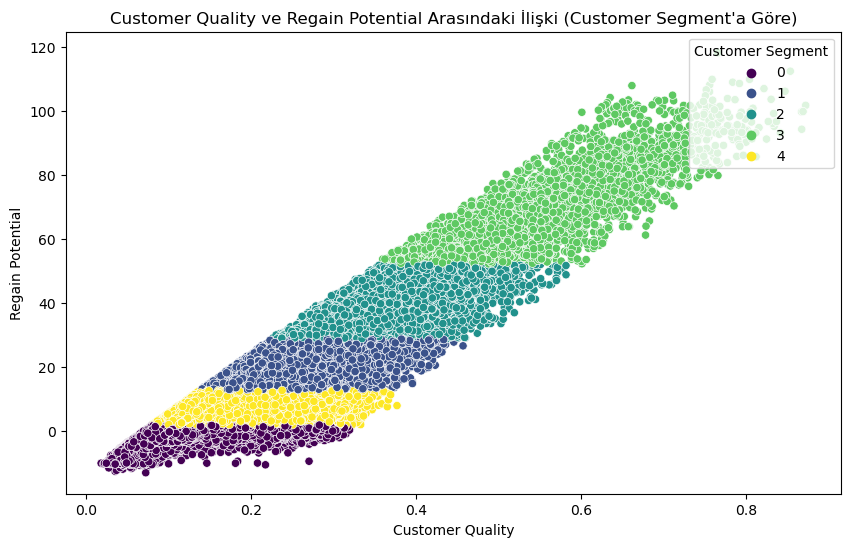

In [27]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_train, x='customer_quality', y='regain_pot_avg', hue='customer_segment', palette='viridis')
plt.title('Customer Quality ve Regain Potential Arasındaki İlişki (Customer Segment\'a Göre)')
plt.xlabel('Customer Quality')
plt.ylabel('Regain Potential')
plt.legend(title='Customer Segment', loc='upper right')
plt.show()

## Model Building

In [28]:
# client_id df_train'de index değil sütun. Bu yüzden bu given_clients_df farklı bır şekilde ayır.
given_clients_df = df_train[df_train['client_id'].isin(given_clients.client_id)]
df_train = df_train[~df_train['client_id'].isin(given_clients.client_id)]
print_info(df_train)

head:                   client_id  city_id  devicename  order_count  \
0  6538ff945bbb65f457cb3979        0          13          1.0   
1  6538ff945bbb65f457ca70bd        0           2          1.0   
2  6538ff945bbb65f457ca6dea        4           2          1.0   
3  6538ff945bbb65f457ca8893        1          13          1.0   
4  6538ff945bbb65f457cb3dad        0          10          1.0   

   order_date_range  total_regain_amount  total_fin_cost  regain_pot_avg  \
0               1.0              10.2638          0.0063         10.2638   
1               1.0              10.7800          0.0000         10.7800   
2               1.0               0.1230          7.7372          0.1230   
3               1.0              10.0800          0.0000         10.0800   
4               1.0               8.7067          6.9122          8.7067   

   delivery_time_avg  decision_time_avg  ...  mode_mastercategory  \
0                8.0          10.000000  ...                    4   
1       

In [29]:
class SimpleNN(nn.Module):
    def __init__(self, input_dim, num_classes=5):
        super(SimpleNN, self).__init__()
        self.fc1 = nn.Linear(input_dim, 256)
        self.fc2 = nn.Linear(256, 128)
        self.fc3 = nn.Linear(128, num_classes)

    def forward(self, x):
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)  # Son katmanda aktivasyon fonksiyonu kullanılmayabilir.
        return x


class PyTorchNNClassifier(BaseEstimator, ClassifierMixin):
    def __init__(self, input_dim, num_classes=5, epochs=100, batch_size=32, use_gpu=True):
        self.input_dim = input_dim
        self.num_classes = num_classes
        self.epochs = epochs
        self.batch_size = batch_size
        self.use_gpu = use_gpu and torch.cuda.is_available()
        self.device = torch.device("cuda" if self.use_gpu else "cpu")
        self.model = SimpleNN(input_dim, num_classes).to(self.device)
        self.criterion = nn.CrossEntropyLoss()
        self.optimizer = optim.Adam(self.model.parameters(), lr=0.001)
        self.scheduler = optim.lr_scheduler.ReduceLROnPlateau(self.optimizer, 'min')

    def fit(self, X_train, y_train, X_val, y_val):
        X_tensor = torch.tensor(X_train, dtype=torch.float32).to(self.device)
        y_tensor = torch.tensor(y_train, dtype=torch.long).to(self.device)
        dataset = TensorDataset(X_tensor, y_tensor)
        dataloader = DataLoader(dataset, batch_size=self.batch_size, shuffle=True)

        best_val_loss = float('inf')
        patience = 5  
        patience_counter = 0  
        for epoch in range(self.epochs):
            self.model.train()
            total_loss = 0
            for xb, yb in dataloader:
                self.optimizer.zero_grad()
                outputs = self.model(xb)
                loss = self.criterion(outputs, yb)
                loss.backward()
                self.optimizer.step()
                total_loss += loss.item()

            # Calculate validation loss
            self.model.eval()
            with torch.no_grad():
                val_outputs = self.model(torch.tensor(X_val, dtype=torch.float32).to(self.device))
                val_loss = self.criterion(val_outputs, torch.tensor(y_val, dtype=torch.long).to(self.device))

            self.scheduler.step(val_loss)

            # Early stopping kontrolü
            if val_loss < best_val_loss:
                best_val_loss = val_loss
                patience_counter = 0  
            else:
                patience_counter += 1  
                if patience_counter >= patience:
                    print(f"Early stopping at epoch {epoch+1}")
                    break

            print(f"Epoch {epoch+1}/{self.epochs}, Loss: {total_loss/len(dataloader):.4f}, Val Loss: {val_loss:.4f}")

    def predict(self, X):
        self.model.eval()
        X_tensor = torch.tensor(X, dtype=torch.float32).to(self.device)
        with torch.no_grad():
            outputs = self.model(X_tensor)
            _, predicted = torch.max(outputs, 1)
        return predicted.cpu().numpy()

    def score(self, X, y):
        y_pred = self.predict(X)
        return accuracy_score(y, y_pred)
    
# Veri setini özellikler ve hedef değişken olarak ayırma
X = df_train.drop(['client_id', 'customer_segment'], axis=1).values
y = df_train['customer_segment'].values

# Modeli eğitim ve doğrulama setleriyle eğitin
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)
# Modelin eğitimi
simp_nn_classifier = PyTorchNNClassifier(input_dim=X_train.shape[1], num_classes=5, epochs=50, batch_size=32)
simp_nn_classifier.fit(X_train, y_train, X_val, y_val)

X_test = given_clients_df.drop(['client_id', 'customer_segment'], axis=1).values
y_test = given_clients_df['customer_segment'].values
#pred xtest 
predictions = simp_nn_classifier.predict(X_test)
clf_given_clients_df = given_clients_df.copy()
clf_given_clients_df['customer_segment_pred_simp'] = predictions
# Modelin test seti üzerinde değerlendirilmesi
accuracy = simp_nn_classifier.score(X_test, y_test)
print(f"Test Accuracy: {accuracy}")

c:\Users\simur\anaconda3\envs\GeneralPurpose\lib\site-packages\tqdm\auto.py:21: TqdmWarning:

IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html



Epoch 1/50, Loss: 0.6485, Val Loss: 0.2253
Epoch 2/50, Loss: 0.2166, Val Loss: 0.2128
Epoch 3/50, Loss: 0.1699, Val Loss: 0.1485
Epoch 4/50, Loss: 0.1413, Val Loss: 0.1810
Epoch 5/50, Loss: 0.1279, Val Loss: 0.1048
Epoch 6/50, Loss: 0.1174, Val Loss: 0.0960
Epoch 7/50, Loss: 0.1101, Val Loss: 0.0942
Epoch 8/50, Loss: 0.1016, Val Loss: 0.1003
Epoch 9/50, Loss: 0.0969, Val Loss: 0.0998
Epoch 10/50, Loss: 0.0908, Val Loss: 0.1230
Epoch 11/50, Loss: 0.0871, Val Loss: 0.0841
Epoch 12/50, Loss: 0.0834, Val Loss: 0.0749
Epoch 13/50, Loss: 0.0815, Val Loss: 0.0622
Epoch 14/50, Loss: 0.0777, Val Loss: 0.0899
Epoch 15/50, Loss: 0.0774, Val Loss: 0.0759
Epoch 16/50, Loss: 0.0737, Val Loss: 0.1057
Epoch 17/50, Loss: 0.0714, Val Loss: 0.0883
Epoch 18/50, Loss: 0.0694, Val Loss: 0.0606
Epoch 19/50, Loss: 0.0681, Val Loss: 0.0538
Epoch 20/50, Loss: 0.0669, Val Loss: 0.0617
Epoch 21/50, Loss: 0.0652, Val Loss: 0.0559
Epoch 22/50, Loss: 0.0643, Val Loss: 0.0566
Epoch 23/50, Loss: 0.0633, Val Loss: 0.05

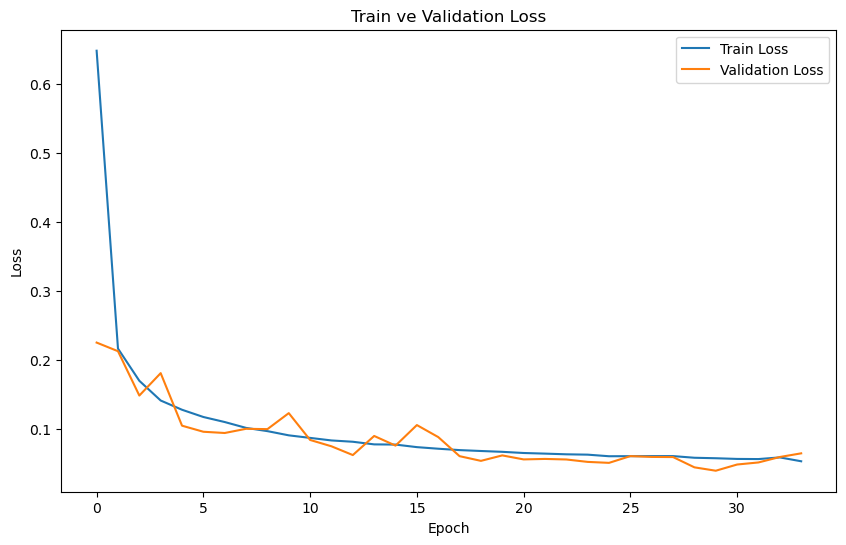

In [31]:
# modelin train ve val loss grafigi
def plot_loss(train_loss, val_loss):
    plt.figure(figsize=(10, 6))
    plt.plot(train_loss, label='Train Loss')
    plt.plot(val_loss, label='Validation Loss')
    plt.title('Train ve Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

# Modelin eğitim ve doğrulama seti üzerindeki kayıp değerlerinin grafiği
train_loss = [0.6485, 0.2166, 0.1699, 0.1413, 0.1279, 0.1174, 0.1101, 0.1016, 0.0969, 0.0908, 0.0871, 0.0834, 0.0815, 0.0777, 0.0774, 0.0737, 0.0714, 0.0694, 0.0681, 0.0669, 0.0652, 0.0643, 0.0633, 0.0628, 0.0605, 0.0606, 0.0607, 0.0607, 0.0583, 0.0576, 0.0566, 0.0564, 0.0588, 0.0532]
val_loss = [0.2253, 0.2128, 0.1485, 0.1810, 0.1048, 0.0960, 0.0942, 0.1003, 0.0998, 0.1230, 0.0841, 0.0749, 0.0622, 0.0899, 0.0759, 0.1057, 0.0883, 0.0606, 0.0538, 0.0617, 0.0559, 0.0566, 0.0558, 0.0523, 0.0509, 0.0607, 0.0595, 0.0593, 0.0444, 0.0395, 0.0485, 0.0515, 0.0594, 0.0647]
plot_loss(train_loss, val_loss)

Classification Report:
               precision    recall  f1-score   support

           0       0.99      1.00      1.00     11846
           1       0.96      0.92      0.94      4603
           2       0.96      0.89      0.93      1879
           3       0.98      0.91      0.94       676
           4       0.96      0.99      0.97      8561

    accuracy                           0.97     27565
   macro avg       0.97      0.94      0.95     27565
weighted avg       0.97      0.97      0.97     27565



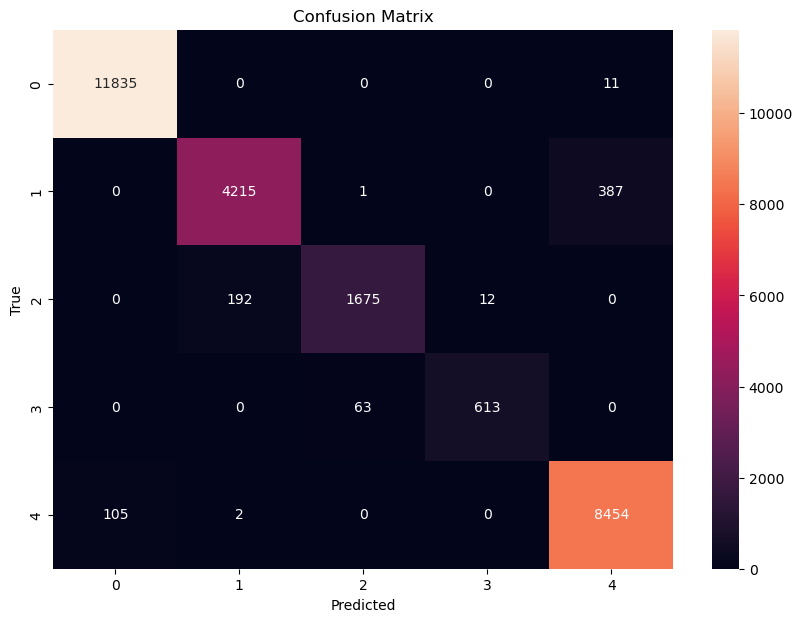

In [30]:
# Performans metriklerinin hesaplanması
report = classification_report(y_test, predictions)
print("Classification Report:\n", report)

# Karışıklık matrisinin oluşturulması
conf_matrix = confusion_matrix(y_test, predictions)

# Karışıklık matrisinin görselleştirilmesi
plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix, annot=True, fmt='g')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

In [32]:
clf_given_clients_df.head()

,client_id,city_id,devicename,order_count,order_date_range,total_regain_amount,total_fin_cost,regain_pot_avg,delivery_time_avg,decision_time_avg,...,mode_product,mode_brand,mode_subcategory,promoobjective_mode,warehouse_regain_pot_avg,warehouse_delivery_time_avg,warehouse_charged_amount_avg,customer_quality,customer_segment,customer_segment_pred_simp
101727,6538ff945bbb65f457cc4cf8,0,13,1.0,1.0,11.2700,0.0000,11.2700,10.0,8.0,...,870,26,87,0.0,11.2700,10.0,11.2700,0.145336,4,4
101729,6538ff945bbb65f457ccdd7e,0,2,1.0,1.0,10.6301,0.0000,10.6301,20.0,2.0,...,704,123,11,0.0,10.6301,20.0,10.6301,0.160516,4,4
101731,6538ff945bbb65f457cc4496,1,13,1.0,1.0,14.6196,0.6005,14.6196,18.0,3.0,...,2163,191,66,0.0,14.6196,18.0,15.2201,0.180368,1,1
101733,6538ff945bbb65f457cd2189,1,2,1.0,1.0,4.9015,6.6381,4.9015,32.0,17.0,...,1518,26,75,1.0,4.9015,32.0,11.5396,0.128509,4,4
101734,6538ff945bbb65f457cce948,5,0,1.0,1.0,14.1771,0.6629,14.1771,13.0,22.0,...,3,3,10,0.0,14.1771,13.0,14.8400,0.178006,1,1


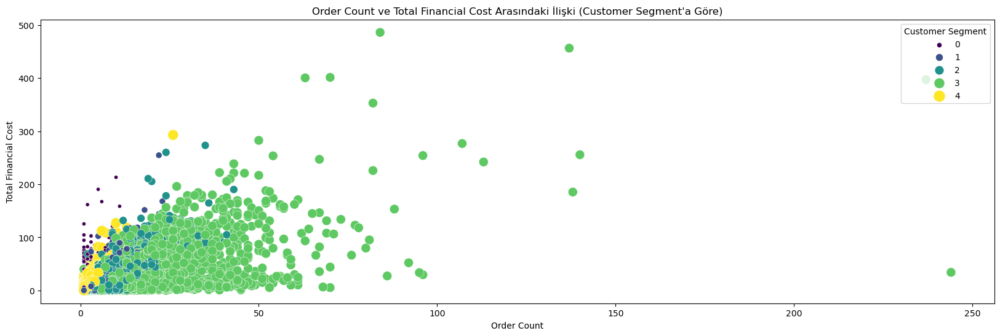

In [58]:
plt.figure(figsize=(20, 6))
sns.scatterplot(data=df_train, x='order_count', y='total_fin_cost', hue='customer_segment', palette='viridis', size='customer_segment', sizes=(20, 150))
plt.title('Order Count ve Total Financial Cost Arasındaki İlişki (Customer Segment\'a Göre)')
plt.xlabel('Order Count')
plt.ylabel('Total Financial Cost')
plt.legend(title='Customer Segment', loc='upper right')
plt.show()


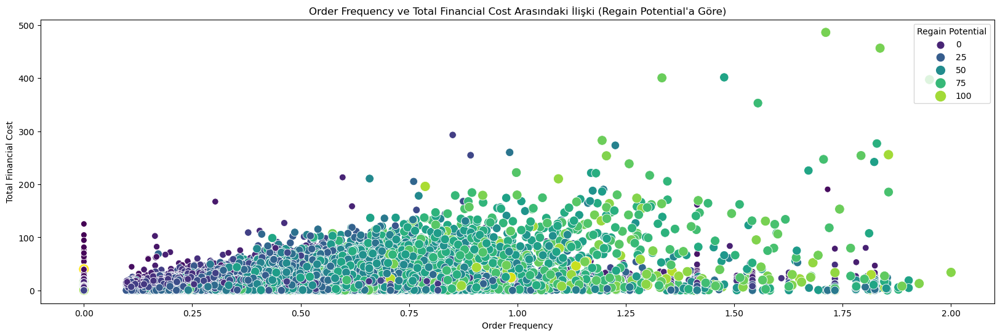

In [56]:
#order frequency ve total fin cost arasındaki ilişki regaın potantial'a göre
plt.figure(figsize=(20, 6))
sns.scatterplot(data=df_train, x='order_frequency', y='total_fin_cost', hue='regain_pot_avg', palette='viridis', size='regain_pot_avg', sizes=(50, 150))
plt.title('Order Frequency ve Total Financial Cost Arasındaki İlişki (Regain Potential\'a Göre)')
plt.xlabel('Order Frequency')
plt.ylabel('Total Financial Cost')
plt.legend(title='Regain Potential', loc='upper right')
plt.show()

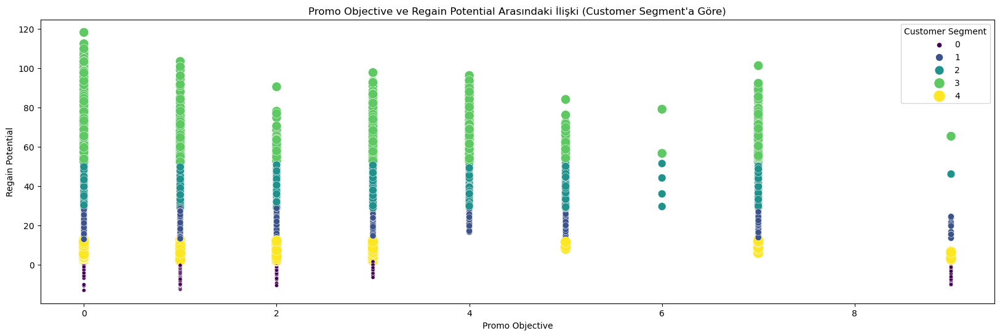

In [61]:
# promo objective ve regain pot avg arasındaki ilişki customer segment'a göre
plt.figure(figsize=(20, 6))
sns.scatterplot(data=df_train, x='promoobjective_mode', y='regain_pot_avg', hue='customer_segment', palette='viridis', size='customer_segment', sizes=(20, 150))
plt.title('Promo Objective ve Regain Potential Arasındaki İlişki (Customer Segment\'a Göre)')
plt.xlabel('Promo Objective')
plt.ylabel('Regain Potential')
plt.legend(title='Customer Segment', loc='upper right')
plt.show()

In [ ]:
# 

In [28]:

MLA = [
    RandomForestRegressor(),
    GradientBoostingRegressor(),
    Ridge(),
    KNeighborsRegressor(),
    DecisionTreeRegressor(),
    XGBRegressor()
]

# Çapraz Doğrulama Yapılandırması
cv_split = ShuffleSplit(n_splits=10, test_size=.3, train_size=.6, random_state=42)

# Çapraz Doğrulama ve Modellerin Karşılaştırılması
MLA_compare = []
for alg in MLA:
    MLA_name = alg.__class__.__name__
    cv_results = cross_val_score(alg, X_train, y_train, cv=cv_split, scoring='r2')
    MLA_compare.append({'MLA Name': MLA_name, 
                        'MLA Test R2 Mean': cv_results.mean(),
                        'MLA Test R2 3*STD': cv_results.std() * 3})

# Sonuçları DataFrame'e dönüştür ve sırala
MLA_compare_df = pd.DataFrame(MLA_compare)
MLA_compare_df.sort_values(by=['MLA Test R2 Mean'], ascending=False, inplace=True)

# Sonuçları Göster
print(MLA_compare_df)


                    MLA Name  MLA Test R2 Mean  MLA Test R2 3*STD
0      RandomForestRegressor          0.994902           0.000758
5               XGBRegressor          0.993689           0.001056
4      DecisionTreeRegressor          0.990358           0.001475
1  GradientBoostingRegressor          0.980714           0.001360
3        KNeighborsRegressor          0.959089           0.003624
2                      Ridge          0.007878           0.001771


In [30]:
def calculate_days_to_next_order(df):
    df = df.sort_values(['client_id', 'orderdate'])
    df['next_order_date'] = df.groupby('client_id')['orderdate'].shift(-1)
    df['days_to_next_order'] = (df['next_order_date'] - df['orderdate']).dt.days
    df.drop('next_order_date', axis=1, inplace=True)
    return df

df = calculate_days_to_next_order(df_transformer_train)
#fill nan days_to_next_order -1
df['days_to_next_order'] = df['days_to_next_order'].fillna(-1)
# fill the nan values in df
df.fillna(0, inplace=True)
given_clients_df = df[df['client_id'].isin(given_clients.client_id)]
df = df[~df['client_id'].isin(given_clients.client_id)].drop(['client_id', 'orderdate'], axis=1)

In [ ]:
# Transformer model tanımı
class TransformerModel(nn.Module):
    def __init__(self, num_numerical_cols, categorical_col_dims, output_size, nhead=4, num_layers=2, dropout_rate=0.1):
        super(TransformerModel, self).__init__()
        self.embeddings = nn.ModuleList([nn.Embedding(num_embeddings, min(50, (num_embeddings + 1) // 2)) for num_embeddings in categorical_col_dims])
        num_embeddings_sum = sum([embedding.embedding_dim for embedding in self.embeddings])
        self.d_model = num_numerical_cols + num_embeddings_sum
        if self.d_model % nhead != 0:
            self.d_model += nhead - (self.d_model % nhead)
        self.transformer = nn.Transformer(d_model=self.d_model, nhead=nhead, num_encoder_layers=num_layers, dropout=dropout_rate, batch_first=True)
        self.linear = nn.Linear(self.d_model, output_size)

    def forward(self, x_numerical, x_categorical):
        embeddings = [embedding(x_categorical[:, i].long()) for i, embedding in enumerate(self.embeddings)]
        x_categorical = torch.cat(embeddings, 1)
        x = torch.cat([x_numerical, x_categorical], 1).unsqueeze(1)
        if x.shape[-1] != self.d_model:
            padding = torch.zeros((x.shape[0], x.shape[1], self.d_model - x.shape[-1]), device=x.device)
            x = torch.cat([x, padding], -1)
        x = self.transformer(x, x)
        x = self.linear(x.squeeze(1))
        return x

# Dataset sınıfı
class OrderDataset(Dataset):
    def __init__(self, dataframe, scaler, categorical_cols):
        self.data = dataframe
        self.scaler = scaler
        self.categorical_cols = categorical_cols
        self.numerical_features = self.scaler.transform(self.data.drop(columns=self.categorical_cols + ['days_to_next_order', 'chargedamount']))
        self.categorical_features = self.data[self.categorical_cols].values
        self.targets = self.data[['days_to_next_order', 'chargedamount']].values

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        numerical = torch.tensor(self.numerical_features[idx], dtype=torch.float32)
        categorical = torch.tensor(self.categorical_features[idx], dtype=torch.float32)
        target = torch.tensor(self.targets[idx], dtype=torch.float32)
        return numerical, categorical, target

# MultiTargetTransformer sınıfı
class MultiTargetTransformer:
    def __init__(self, input_dim, output_dim, categorical_col_dims, nhead=4, num_layers=2, dropout_rate=0.1, learning_rate=0.001):
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.model = TransformerModel(input_dim, categorical_col_dims, output_dim, nhead, num_layers, dropout_rate).to(self.device)
        self.criterion = nn.MSELoss()
        self.optimizer = optim.Adam(self.model.parameters(), lr=learning_rate)
        self.scheduler = optim.lr_scheduler.ReduceLROnPlateau(self.optimizer, 'min')

    def train(self, train_loader, val_loader, epochs, patience=5):
        best_val_loss = float('inf')
        patience_counter = 0
        for epoch in range(epochs):
            self.model.train()
            total_loss = 0
            for numerical, categorical, targets in train_loader:
                numerical, categorical, targets = numerical.to(self.device), categorical.to(self.device), targets.to(self.device)
                self.optimizer.zero_grad()
                outputs = self.model(numerical, categorical)
                loss = self.criterion(outputs, targets)
                loss.backward()
                self.optimizer.step()
                total_loss += loss.item()
            val_loss = 0
            self.model.eval()
            with torch.no_grad():
                for numerical, categorical, targets in val_loader:
                    numerical, categorical, targets = numerical.to(self.device), categorical.to(self.device), targets.to(self.device)
                    outputs = self.model(numerical, categorical)
                    val_loss += self.criterion(outputs, targets).item()
            val_loss /= len(val_loader)
            self.scheduler.step(val_loss)
            if val_loss < best_val_loss:
                best_val_loss = val_loss
                patience_counter = 0
            else:
                patience_counter += 1
                if patience_counter >= patience:
                    print(f"Early stopping at epoch {epoch+1}")
                    break
            print(f"Epoch {epoch+1}/{epochs}, Loss: {total_loss/len(train_loader):.4f}, Val Loss: {val_loss:.4f}")
    
    def save_model(self, path='transformer_model.pth'):
        torch.save(self.model.state_dict(), path)


# Kullanımı:
categorical_cols = ['city_id', 'warehouse_id', 'mastercategory_mode', 'brand_mode', 'subcategory_mode', 'product_mode', 'responsibledepartment_id', 'promoobjective']
for col in categorical_cols:
    df[col], _ = pd.factorize(df[col])

# Ölçeklendirici ve veri setlerini hazırlama
scaler = StandardScaler().fit(df.drop(columns=categorical_cols + ['days_to_next_order', 'chargedamount']))

# Girdi ve çıktı boyutlarını hesaplama
input_dim = len(df.columns) - len(categorical_cols) - 2
output_dim = 2
categorical_col_dims = [df[col].nunique() for col in categorical_cols]

# Eğitim ve doğrulama veri setlerini hazırlama
train_df, val_df = train_test_split(df, test_size=0.2)
train_dataset = OrderDataset(train_df, scaler, categorical_cols)
val_dataset = OrderDataset(val_df, scaler, categorical_cols)

# DataLoader'lar
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32)

# Modeli oluşturma ve eğitme
multi_target_transformer = MultiTargetTransformer(input_dim, output_dim, categorical_col_dims)
multi_target_transformer.train(train_loader, val_loader, epochs=10)
multi_target_transformer.save_model()


In [ ]:
# Ölçeklendirme işlemi
X_numerical = scaler.transform(given_clients_df.drop(categorical_cols + ['client_id', 'orderdate', 'days_to_next_order', 'chargedamount'], axis=1))
X_categorical = given_clients_df[categorical_cols].values

# Tahminler için PyTorch tensörlerine dönüştürme
X_numerical = torch.tensor(X_numerical, dtype=torch.float32)
X_categorical = torch.tensor(X_categorical, dtype=torch.float32)
predictions = []

# Model tahminleri
multi_target_transformer.model.eval()
with torch.no_grad():
    for i in range(len(X_numerical)):
        numerical = X_numerical[i].unsqueeze(0).to(multi_target_transformer.device)
        categorical = X_categorical[i].unsqueeze(0).to(multi_target_transformer.device)
        prediction = multi_target_transformer.model(numerical, categorical)
        predictions.append(prediction.cpu().numpy())

predictions = np.array(predictions).squeeze()

# Gerçek değerler
y_test_days = given_clients_df['days_to_next_order'].values
y_test_revenue = given_clients_df['chargedamount'].values

# Performans metriklerini hesaplama
mse_days = mean_squared_error(y_test_days, predictions[:, 0])
mse_revenue = mean_squared_error(y_test_revenue, predictions[:, 1])
mae_days = mean_absolute_error(y_test_days, predictions[:, 0])
mae_revenue = mean_absolute_error(y_test_revenue, predictions[:, 1])
r2_days = r2_score(y_test_days, predictions[:, 0])
r2_revenue = r2_score(y_test_revenue, predictions[:, 1])

print(f"MSE for Days to Next Order: {mse_days}")
print(f"MSE for Next Order Revenue: {mse_revenue}")
print(f"MAE for Days to Next Order: {mae_days}")
print(f"MAE for Next Order Revenue: {mae_revenue}")
print(f"R2 Score for Days to Next Order: {r2_days}")
print(f"R2 Score for Next Order Revenue: {r2_revenue}")

# Görselleştirme
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.scatter(y_test_days, predictions[:, 0], alpha=0.5)
plt.plot([y_test_days.min(), y_test_days.max()], [y_test_days.min(), y_test_days.max()], 'k--', lw=2)
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahminler')
plt.title('Days to Next Order - Gerçek vs Tahmin')

plt.subplot(1, 2, 2)
plt.scatter(y_test_revenue, predictions[:, 1], alpha=0.5)
plt.plot([y_test_revenue.min(), y_test_revenue.max()], [y_test_revenue.min(), y_test_revenue.max()], 'k--', lw=2)
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahminler')
plt.title('Next Order Revenue - Gerçek vs Tahmin')

plt.tight_layout()
plt.show()